# Python

## Исследование заведений общественного питания Москвы


**Цель:** исследовать рынок общественного питания Москвы, найти интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных:**

/datasets/moscow_places.csv

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**План:**

- анализ текущих показателей и характеристик заведений общественного питания Москвы;
- исследование кофеен Москвы и выявление их особенностей.

## Загрузка данных, общая информация. 

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_palette("Set2")
import warnings
warnings.filterwarnings("ignore")
import datetime as dt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import scipy.stats as stats

from plotly import graph_objects as go
import math as mth
from scipy import stats as st

pd.options.display.max_colwidth = 210

from pandas.io.json import json_normalize
from pprint import pprint
import json

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


    Представдено 8406 заведений общественного питания.
    Таблица содержит 14 столбцов с типами данных float(6 столбцов), int(1 столбец) и object(7 столбцов).

## Предобработка данных.
Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
Выполните предобработку данных:
- Создайте столбец street с названиями улиц из столбца с адресом.
- Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

логическое значение True — если заведение работает ежедневно и круглосуточно;

логическое значение False — в противоположном случае.

In [5]:
df.duplicated().sum()

0

In [6]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [7]:
df.duplicated(subset=['name', 'address']).sum()

4

In [8]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [9]:
df['street']=[x.split(', ')[1] for x in df['address'].values]

In [10]:
#Код ревьюера
df.query('street == "проспект мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00–21:00",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира
800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,проспект мира
909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,0,273.0,проспект мира
2571,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0,проспект мира
2572,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,0,200.0,проспект мира
4782,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,проспект мира


In [11]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [12]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


    Явные дубликаты не обнаружены, неявных дубликатов - 4 штуки.
    Есть пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Их оставим как есть, т.к. 
    ни средним, ни медианой, ни 0 их не заполнить без ухудшения качества представленной информации - данные будут искажены.
    Добавлены столбцы street и is_24_7.
    

## Анализ данных.

### Какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [13]:
df_category = df.groupby('category').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
df_category['share, %'] = round(df_category['name'] / df_category['name'].sum() * 100, 2)
df_category

,category,name,"share, %"
0,кафе,2378,28.29
1,ресторан,2043,24.30
2,кофейня,1413,16.81
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


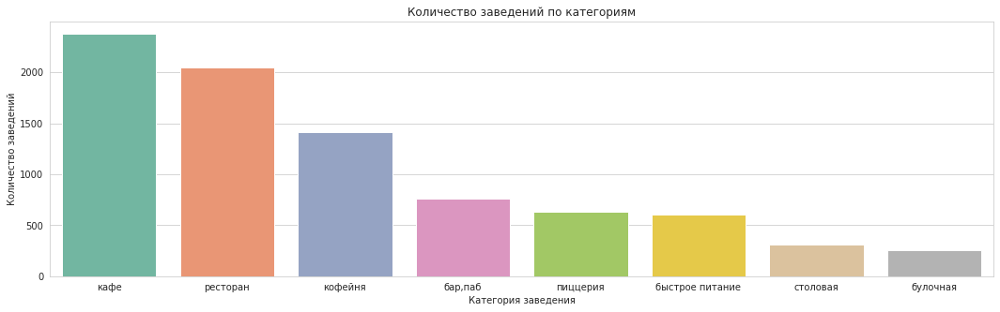

In [14]:
sns.set_style('whitegrid')
plt.figure(figsize=(18, 5))
sns.barplot(data = df_category, x='category', y='name')
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.show()

     В датасете представлены 8 категорий заведений общественного питания.
     Перечень категорий по убыванию распространенности:
         - кафе
         - ресторан
         - кофейня
         - бар, паб
         - пиццерия
         - быстрое питание
         - столовая
         - булочная

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [15]:
pvt = df.pivot_table(index=['category'], values='seats', aggfunc='median').sort_values(by='seats', ascending=False).reset_index()
pvt

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


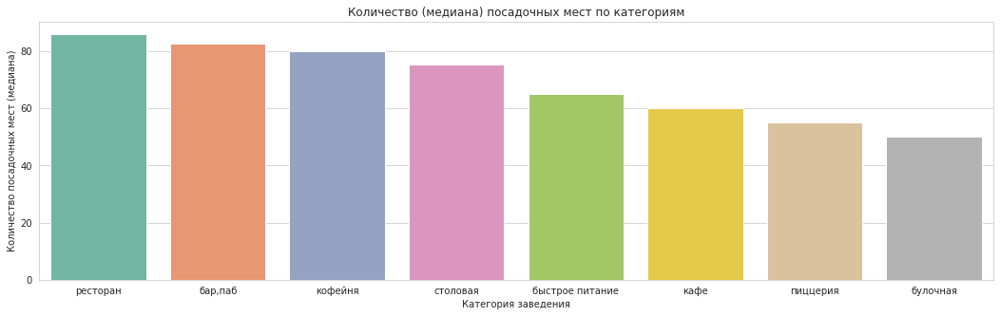

In [16]:
sns.set_style('whitegrid')
plt.figure(figsize=(18, 5))
sns.barplot(data = pvt, x='category', y='seats')
plt.title('Количество (медиана) посадочных мест по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест (медиана)')
plt.show()

    Больше всего посадочных мест в ресторанах, барах и пабах, кофейнях и столовых.

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [17]:
pvt2 = df.pivot_table(index=['chain'], values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
pvt2['percent'] = round(pvt2['name'] / pvt2['name'].sum() * 100, 2)
pvt2

,chain,name,percent
0,0,5201,61.87
1,1,3205,38.13


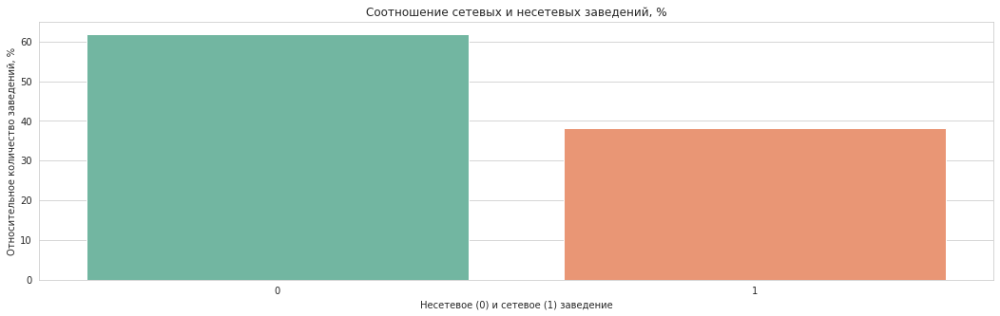

In [18]:
sns.set_style('whitegrid')
plt.figure(figsize=(18, 5))
sns.barplot(data = pvt2, x='chain', y='percent')
plt.title('Соотношение сетевых и несетевых заведений, %')
plt.xlabel('Несетевое (0) и сетевое (1) заведение')
plt.ylabel('Относительное количество заведений, %')
plt.show()

In [19]:
from plotly import graph_objects as go

name_rest = ['Несетевые', 'Сетевые']
values = [5201, 3205]

fig = go.Figure(data=[go.Pie(labels=name_rest, values=values)])
fig.show() 

    Сетевых заведений только 38%.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [20]:
df_chain = df.query('chain == 1')
pvt3 = df_chain.pivot_table(index=['category'], values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
pvt3['percent'] = round(pvt3['name'] / pvt3['name'].sum() * 100, 2)
pvt3

,category,name,percent
0,кафе,779,24.31
1,ресторан,730,22.78
2,кофейня,720,22.46
3,пиццерия,330,10.30
4,быстрое питание,232,7.24
5,"бар,паб",169,5.27
6,булочная,157,4.90
7,столовая,88,2.75


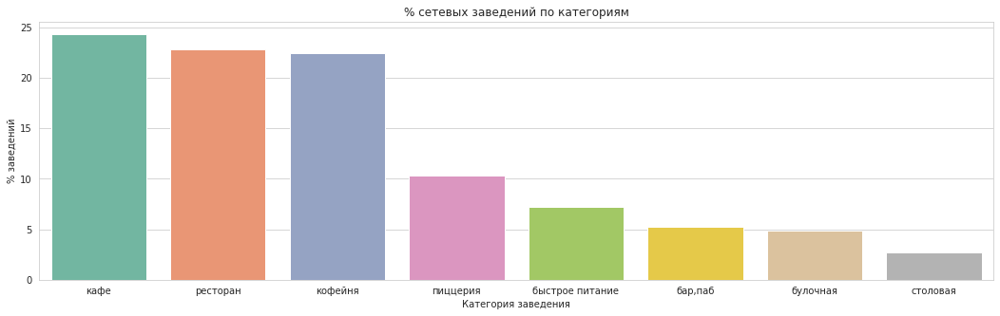

In [21]:
sns.set_style('whitegrid')
plt.figure(figsize=(18, 5))
sns.barplot(data = pvt3, x='category', y='percent')
plt.title('% сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('% заведений')
plt.show()

In [22]:
#Код ревьюера
df_chain_share = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')

df_chain_share = df_chain_share.sort_values(by='share', ascending=False).reset_index()
df_chain_share

,category,not_chain,chain,total,share
0,булочная,99,157,256,61
1,пиццерия,303,330,633,52
2,кофейня,693,720,1413,51
3,быстрое питание,371,232,603,38
4,ресторан,1313,730,2043,36
5,кафе,1599,779,2378,33
6,столовая,227,88,315,28
7,"бар,паб",596,169,765,22


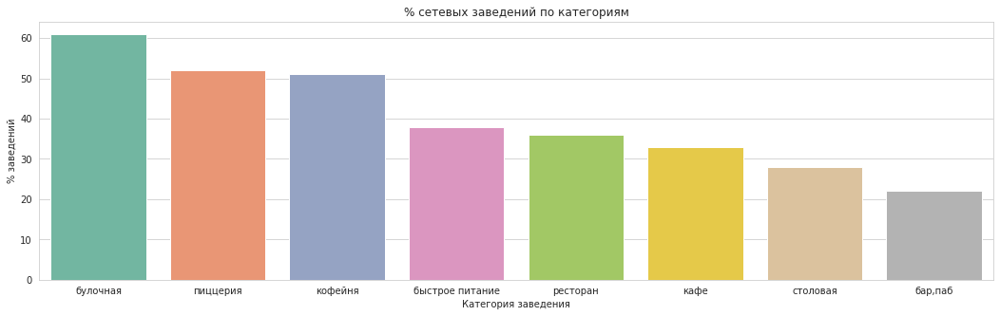

In [23]:
sns.set_style('whitegrid')
plt.figure(figsize=(18, 5))
sns.barplot(data = df_chain_share, x='category', y='share')
plt.title('% сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('% заведений')
plt.show()

    Топ-3 категории сетевых заведений:
        - кафе
        - ресторан
        - кофейня

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [24]:
top15 = df.query('chain == 1')
#top_15 = df_chain.groupby('name').count().sort_values(by='category', ascending=False).head(15).reset_index()
top_15 = df_chain.groupby(['name', 'category'], as_index = False)[['street']].count().sort_values(by='street', ascending=False).head(15)
top_15

,name,category,street
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [25]:
fig = make_subplots(rows=1, cols=2,specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(go.Pie(
     values=top_15['street'],
     labels=top_15['name'],
     title="Популярные сетевые заведения"),
     row=1, col=1)

fig.add_trace(go.Pie(
     values=top_15['street'],
     labels=top_15['category'],
     title="Категории популярных сетевых заведений",
     text=top_15['category']), 
     row=1, col=2)

fig.show()

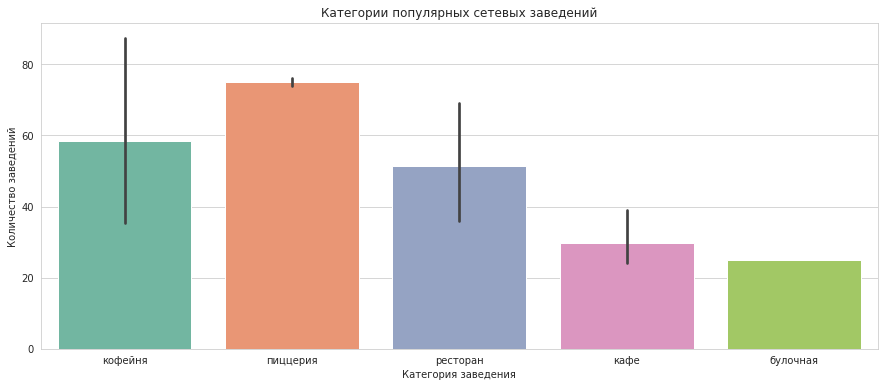

In [26]:
plt.figure(figsize=(15,6))
sns.barplot(data = top_15, x='category', y='street')
plt.title('Категории популярных сетевых заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')

plt.show()

    Кофейни, пиццерии и рестораны быстрого питания не выше среднего ценового сегмента превалируют.

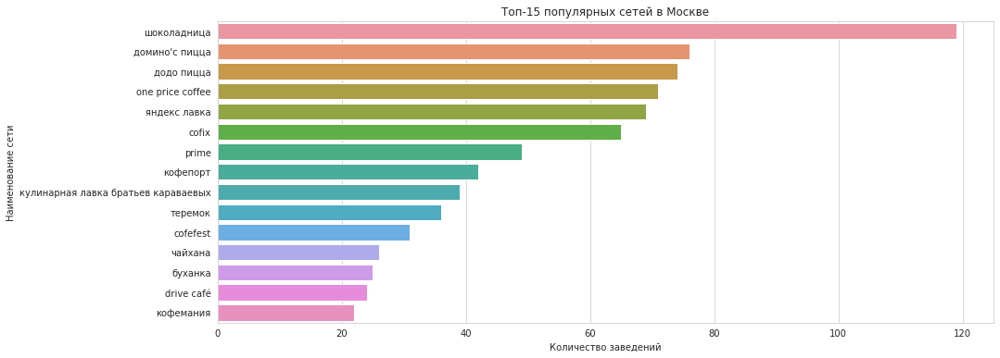

In [27]:
plt.figure(figsize=(15,6))
sns.barplot(data = top_15, x='street', y='name')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Наименование сети')

plt.show()

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [28]:
df_dist = df.groupby('district')['name'].count().sort_values(ascending=False).to_frame().reset_index()
df_dist['share, %'] = round(df_dist['name'] / df_dist['name'].sum() * 100, 2)
df_dist

,district,name,"share, %"
0,Центральный административный округ,2242,26.67
1,Северный административный округ,900,10.71
2,Южный административный округ,892,10.61
3,Северо-Восточный административный округ,891,10.60
4,Западный административный округ,851,10.12
5,Восточный административный округ,798,9.49
6,Юго-Восточный административный округ,714,8.49
7,Юго-Западный административный округ,709,8.43
8,Северо-Западный административный округ,409,4.87


In [29]:
area = df.groupby(['category','district'])['name'].count().reset_index().sort_values(by='district', ascending=False)
area.head()

,category,district,name
71,столовая,Южный административный округ,44
8,"бар,паб",Южный административный округ,68
35,кафе,Южный административный округ,264
17,булочная,Южный административный округ,25
44,кофейня,Южный административный округ,131


In [30]:
plt.figure(figsize=(16,6))
fig = px.bar(area, x='name', y='district', color='category')
fig.update_layout(title='Количество и категории заведений по округам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Округ',
                  yaxis={'categoryorder':'total ascending'})
fig.show()

<Figure size 1152x432 with 0 Axes>

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [31]:
df_rating = df.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()
df_rating

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [32]:
round(df['rating'].describe(), 2)

count    8406.00
mean        4.23
std         0.47
min         1.00
25%         4.10
50%         4.30
75%         4.40
max         5.00
Name: rating, dtype: float64

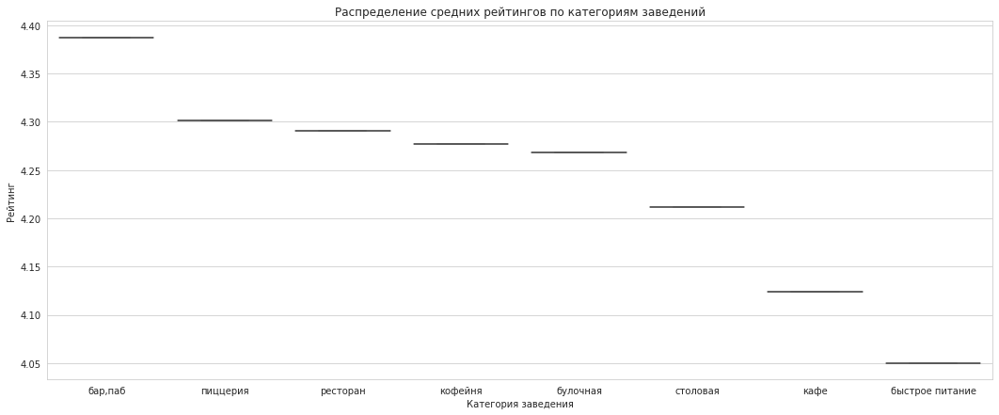

In [33]:
pvt11 = df.pivot_table(index=['category'], values='rating').reset_index().sort_values(by='rating', ascending=False)
 
sns.set_style('whitegrid')
plt.figure(figsize=(18, 7))
sns.boxplot(data = pvt11, x='category', y='rating', showfliers=False)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.show()

    В подавляющем большинстве заведений рейтинг не ниже 4.0 из 5.0.
    Значимых различий средних значений рейтинга по категориям не обнаружено.

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [34]:
geo_data='https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

In [35]:
pvt12 = df.pivot_table(index=['district'], values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)

In [36]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=pvt12,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [37]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [38]:
temp = df.groupby('street').count().sort_values(by='name', ascending=False).head(15).reset_index()
top_15 = list(temp['street'])
street15 = df.query('street == @top_15')
street_15 = street15.groupby(['street', 'category']).count().sort_values(by='name', ascending=False).reset_index()
street_15.head()

,street,category,name,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
0,проспект мира,кафе,53,53,53,49,53,53,53,16,15,15,0,53,17,49
1,мкад,кафе,45,45,45,33,45,45,45,3,3,3,0,45,0,33
2,проспект мира,ресторан,45,45,45,43,45,45,45,23,26,26,0,45,24,43
3,проспект мира,кофейня,36,36,36,35,36,36,36,11,14,5,9,36,22,35
4,профсоюзная улица,кафе,35,35,35,29,35,35,35,7,7,7,0,35,24,29


In [39]:
plt.figure(figsize=(16,6))
fig = px.bar(street_15, x='name', y='street', color='category')
fig.update_layout(title='Количество и категории заведений по топ-15 улицам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Улица',
                  yaxis={'categoryorder':'total ascending'})
fig.show()

<Figure size 1152x432 with 0 Axes>

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [40]:
df_street1 = df.groupby(['street']).agg({'name': 'count'}).sort_values(by='name').reset_index()
df_street1 = df_street1.query('name == 1')
len(df_street1)

457

    В Москве 457 улиц с только 1 объектом общепита.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [41]:
df_avg_bill = df.groupby('district').agg({'middle_avg_bill': 'median'}).sort_values(by='middle_avg_bill', ascending=False).reset_index()
df_avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo1 = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo1,
    data=df_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    #fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

    В центре и на западе Москвы в среднем тратят больше всего, хотя на севере и северо-западе и заведений больше, 
    средний чек ниже, а средний рейтинг лучше дорогих заведений западного направления.

### Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

Соберите наблюдения по вопросам выше в один общий вывод.

    Всего 8406 заведений общественного питания из 8 категорий.
    Категории по убыванию распространенности:
     - кафе
     - ресторан
     - кофейня
     - бар, паб
     - пиццерия
     - быстрое питание
     - столовая
     - булочная
     
     Сетевых заведений только 38%. 
     Топ-3 категории сетевых заведений:
    - кафе
    - ресторан
    - кофейня


## Детализируем исследование: открытие кофейни.

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [43]:
cofeeshop = 'кофейня'
df_coffeeshop = df.query('category == @cofeeshop')

In [44]:
len(df_coffeeshop['name'])

1413

In [45]:
df_cof = df_coffeeshop.groupby('district').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
df_cof['share, %'] = round(df_cof['name'] / df_cof['name'].sum() * 100, 2)
df_cof

,district,name,"share, %"
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


In [46]:
len(df_coffeeshop.query('is_24_7 == 1'))

59

In [47]:
coffee24 = df_coffeeshop.query('is_24_7 == 1')
coffee24_7 = coffee24.groupby('district').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
coffee24_7

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [48]:
pvt13 = df_coffeeshop.pivot_table(index=['district'], values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)

In [49]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=pvt13,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

In [50]:
df_coffeeshop.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [51]:
df_coffee_price = df.groupby(['district']).agg({'middle_coffee_cup': 'median', 'rating': 'median'}).sort_values(by='middle_coffee_cup', ascending=False).reset_index()
df_coffee_price.head(10)

,district,middle_coffee_cup,rating
0,Юго-Западный административный округ,197.0,4.3
1,Центральный административный округ,190.0,4.4
2,Западный административный округ,187.0,4.3
3,Северо-Восточный административный округ,162.5,4.2
4,Северный административный округ,159.0,4.3
5,Северо-Западный административный округ,150.0,4.3
6,Южный административный округ,149.5,4.3
7,Юго-Восточный административный округ,145.0,4.2
8,Восточный административный округ,135.0,4.3


In [52]:
df_coffee_price = df.groupby(['district']).agg({'middle_coffee_cup': 'median', 'rating': 'median', 'seats': 'median'}).sort_values(by='middle_coffee_cup', ascending=False).reset_index()
df_coffee_price.head(10)

,district,middle_coffee_cup,rating,seats
0,Юго-Западный административный округ,197.0,4.3,70.0
1,Центральный административный округ,190.0,4.4,92.0
2,Западный административный округ,187.0,4.3,90.0
3,Северо-Восточный административный округ,162.5,4.2,70.0
4,Северный административный округ,159.0,4.3,60.0
5,Северо-Западный административный округ,150.0,4.3,85.0
6,Южный административный округ,149.5,4.3,75.0
7,Юго-Восточный административный округ,145.0,4.2,55.5
8,Восточный административный округ,135.0,4.3,50.0


    Всего в Москве 1413 кофеен, из них 59 круглосуточных. Центр и запад города имеет лучший доступ к круглосуточному кофе.
    
    Хороший рейтинг и чашка капучино стоимостью около 200 рублей идут рука об руку. Плюс надо учесть что потребуется не 
    только вкусный и недорогой кофе, но и достаточно большая площадь, чтобы обеспечить уютные посиделки 
    как в "Central Perk", в среднем для 50 кофеманов.